In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
!pip install albumentations
!pip install timm

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 60.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 59.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 41.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 40.9 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitlin

In [ ]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import cv2
from sklearn.model_selection import train_test_split
import albumentations as A
from IPython.display import display
import ipywidgets as widgets
from google.colab import files
import zipfile
import shutil

# Create upload button
upload_button = widgets.Button(description='Upload Dataset')
output = widgets.Output()

def on_button_clicked(b):
    with output:
        print("Please select your zipped dataset file...")
        uploaded = files.upload()

        # Create a directory for the dataset
        os.makedirs('dataset', exist_ok=True)

        # Extract the uploaded zip file
        for fn in uploaded.keys():
            print('Extracting {}...'.format(fn))
            with zipfile.ZipFile(fn, 'r') as zip_ref:
                zip_ref.extractall('dataset')

        print("Dataset uploaded and extracted successfully!")

upload_button.on_click(on_button_clicked)
display(upload_button, output)

Button(description='Upload Dataset', style=ButtonStyle())

Output()

In [ ]:
def verify_dataset():
    dataset_path = 'dataset'

    # List all files
    files = os.listdir(dataset_path)

    # Count different types of files
    original_images = [f for f in files if f.endswith('.jpg')]
    first_masks = [f for f in files if f.endswith('1stHO.png')]
    second_masks = [f for f in files if f.endswith('2ndHO.png')]

    print(f"Found {len(original_images)} original images")
    print(f"Found {len(first_masks)} first observer masks")
    print(f"Found {len(second_masks)} second observer masks")

    # Verify matching files
    all_valid = True
    for img in original_images:
        base_name = img[:-4]
        mask1 = f"{base_name}_1stHO.png"
        mask2 = f"{base_name}_2ndHO.png"

        if mask1 not in first_masks or mask2 not in second_masks:
            print(f"Warning: Missing masks for {img}")
            all_valid = False

    if all_valid:
        print("Dataset structure verified successfully!")
    return all_valid

# Run verification
verify_dataset()

Found 28 original images
Found 28 first observer masks
Found 28 second observer masks
Dataset structure verified successfully!


True

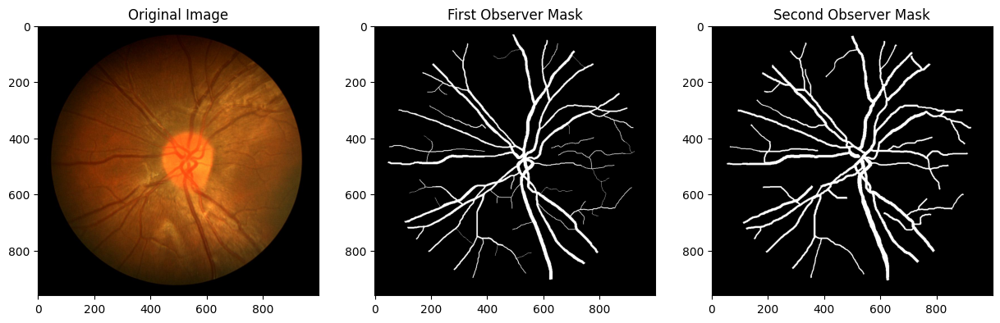

In [ ]:
import matplotlib.pyplot as plt

def display_sample():
    dataset_path = 'dataset'
    files = os.listdir(dataset_path)

    # Get first image and its masks
    img_file = next(f for f in files if f.endswith('.jpg'))
    base_name = img_file[:-4]

    # Load images
    img = cv2.imread(os.path.join(dataset_path, img_file))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    mask1 = cv2.imread(os.path.join(dataset_path, f"{base_name}_1stHO.png"), cv2.IMREAD_GRAYSCALE)
    mask2 = cv2.imread(os.path.join(dataset_path, f"{base_name}_2ndHO.png"), cv2.IMREAD_GRAYSCALE)

    # Display
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(img)
    axes[0].set_title('Original Image')
    axes[1].imshow(mask1, cmap='gray')
    axes[1].set_title('First Observer Mask')
    axes[2].imshow(mask2, cmap='gray')
    axes[2].set_title('Second Observer Mask')

    plt.show()

# Display sample images
display_sample()

In [ ]:
class RetinalVesselDataset(Dataset):
    def __init__(self, image_paths, mask_paths, transform=None):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        # Load image
        image = cv2.imread(self.image_paths[idx])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Load masks
        mask1 = cv2.imread(self.mask_paths[idx][0], cv2.IMREAD_GRAYSCALE)
        mask2 = cv2.imread(self.mask_paths[idx][1], cv2.IMREAD_GRAYSCALE)

        # Combine masks (using logical OR)
        mask = ((mask1 + mask2) > 0).astype(np.uint8)

        if self.transform:
            augmented = self.transform(image=image, mask=mask)
            image = augmented['image']
            mask = augmented['mask']

        # Convert to tensor
        image = torch.from_numpy(image).permute(2, 0, 1).float() / 255.0
        mask = torch.from_numpy(mask).float()

        return image, mask

In [ ]:
def prepare_local_data():
    dataset_path = 'dataset'
    image_paths = []
    mask_paths = []

    for filename in os.listdir(dataset_path):
        if filename.endswith('.jpg'):
            image_path = os.path.join(dataset_path, filename)
            base_name = filename[:-4]

            mask1_path = os.path.join(dataset_path, f"{base_name}_1stHO.png")
            mask2_path = os.path.join(dataset_path, f"{base_name}_2ndHO.png")

            if os.path.exists(mask1_path) and os.path.exists(mask2_path):
                image_paths.append(image_path)
                mask_paths.append((mask1_path, mask2_path))

    # Split data
    train_imgs, test_imgs, train_masks, test_masks = train_test_split(
        image_paths, mask_paths, test_size=0.28, random_state=42
    )

    print(f"Training images: {len(train_imgs)}")
    print(f"Testing images: {len(test_imgs)}")

    return train_imgs, test_imgs, train_masks, test_masks

# Prepare the data
train_imgs, test_imgs, train_masks, test_masks = prepare_local_data()

Training images: 20
Testing images: 8


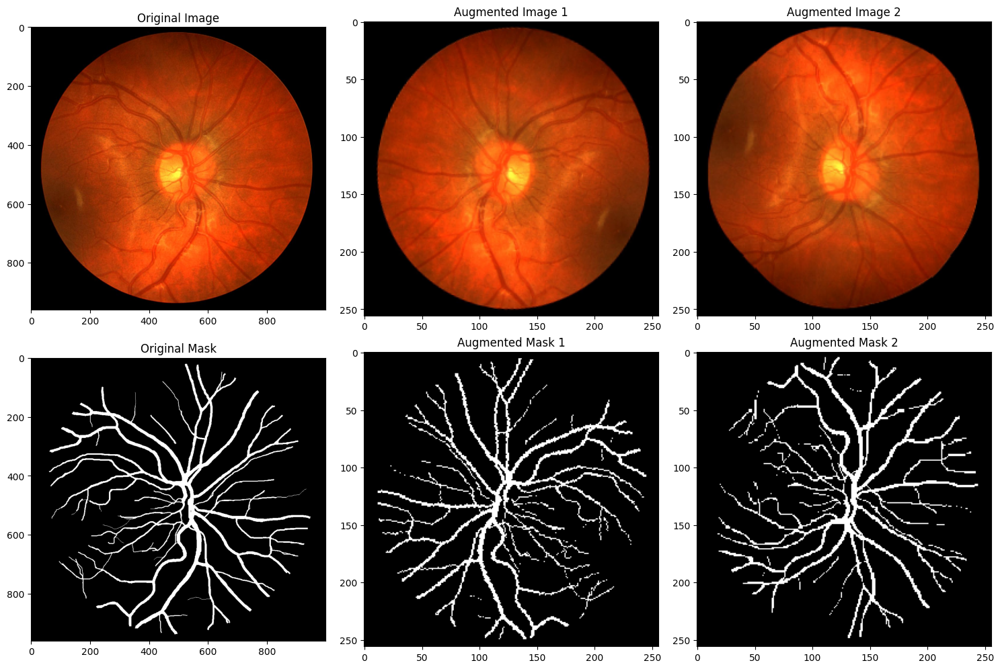

In [ ]:
import albumentations as A

def get_transforms(phase):
    if phase == 'train':
        return A.Compose([
            A.Resize(256, 256),
            A.HorizontalFlip(p=0.5),
            A.VerticalFlip(p=0.5),
            A.Rotate(limit=30, p=0.5),
            A.RandomBrightnessContrast(p=0.2),
            A.GaussNoise(p=0.2),
            A.GridDistortion(p=0.2)
        ])
    else:  # test/val transforms
        return A.Compose([
            A.Resize(256, 256)
        ])

# Create preview function to check augmentations
def preview_augmentations():
    # Get first training image and its masks
    img = cv2.imread(train_imgs[0])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    mask1 = cv2.imread(train_masks[0][0], cv2.IMREAD_GRAYSCALE)
    mask2 = cv2.imread(train_masks[0][1], cv2.IMREAD_GRAYSCALE)
    mask = ((mask1 + mask2) > 0).astype(np.uint8)

    # Apply augmentations multiple times
    transform = get_transforms('train')
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))

    # Original
    axes[0,0].imshow(img)
    axes[0,0].set_title('Original Image')
    axes[1,0].imshow(mask, cmap='gray')
    axes[1,0].set_title('Original Mask')

    # Augmented versions
    for i in range(2):
        for j in range(1,3):
            augmented = transform(image=img, mask=mask)
            axes[0,j].imshow(augmented['image'])
            axes[0,j].set_title(f'Augmented Image {j}')
            axes[1,j].imshow(augmented['mask'], cmap='gray')
            axes[1,j].set_title(f'Augmented Mask {j}')

    plt.tight_layout()
    plt.show()

# Preview augmentations
preview_augmentations()

Batch shapes:
Images: torch.Size([4, 3, 256, 256])
Masks: torch.Size([4, 256, 256])


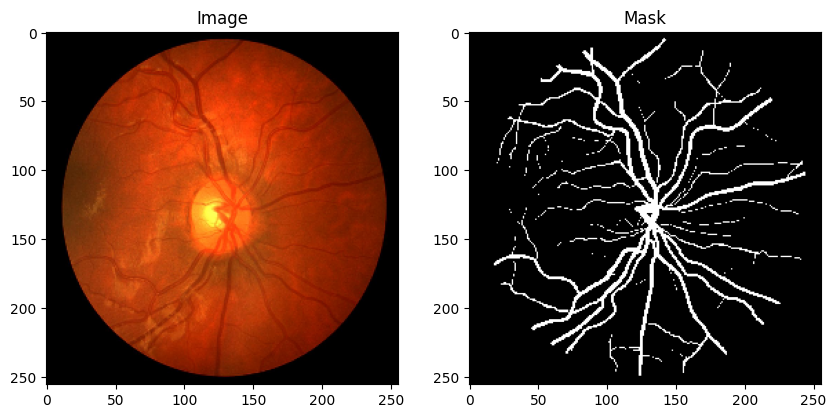

In [ ]:
# Create datasets
train_dataset = RetinalVesselDataset(
    train_imgs,
    train_masks,
    transform=get_transforms('train')
)

test_dataset = RetinalVesselDataset(
    test_imgs,
    test_masks,
    transform=get_transforms('test')
)

# Create data loaders
train_loader = DataLoader(
    train_dataset,
    batch_size=4,
    shuffle=True,
    num_workers=2,
    pin_memory=True if torch.cuda.is_available() else False
)

test_loader = DataLoader(
    test_dataset,
    batch_size=4,
    shuffle=False,
    num_workers=2,
    pin_memory=True if torch.cuda.is_available() else False
)

# Verify data loaders
def check_data_loaders():
    # Get a batch from train loader
    images, masks = next(iter(train_loader))
    print("Batch shapes:")
    print(f"Images: {images.shape}")
    print(f"Masks: {masks.shape}")

    # Display first image and mask from batch
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

    # Convert tensor to numpy for visualization
    img = images[0].permute(1,2,0).numpy()
    mask = masks[0].numpy()

    ax1.imshow(img)
    ax1.set_title('Image')
    ax2.imshow(mask, cmap='gray')
    ax2.set_title('Mask')
    plt.show()

# Check data loaders
check_data_loaders()

In [ ]:
# Combination of Binary Cross Entropy and Dice Loss
class DiceBCELoss(nn.Module):
    def __init__(self):
        super(DiceBCELoss, self).__init__()
        self.bce = nn.BCEWithLogitsLoss()

    def forward(self, inputs, targets):
        smooth = 1.
        inputs = torch.sigmoid(inputs)
        inputs_flat = inputs.view(-1)
        targets_flat = targets.view(-1)
        intersection = (inputs_flat * targets_flat).sum()
        dice = (2. * intersection + smooth) / (inputs_flat.sum() + targets_flat.sum() + smooth)
        bce = self.bce(inputs_flat, targets_flat)
        return bce + (1 - dice)


class FocalTverskyLoss(nn.Module): # Corrected indentation
    def __init__(self, alpha=0.7, gamma=0.75): # Corrected indentation
        super(FocalTverskyLoss, self).__init__() # Corrected indentation
        self.alpha = alpha # Corrected indentation
        self.gamma = gamma # Corrected indentation

    def forward(self, inputs, targets): # Corrected indentation
        inputs = torch.sigmoid(inputs) # Corrected indentation
        TP = (inputs * targets).sum() # Corrected indentation
        FP = ((1 - targets) * inputs).sum() # Corrected indentation
        FN = (targets * (1 - inputs)).sum() # Corrected indentation
        Tversky = (TP + 1e-5) / (TP + self.alpha * FP + (1 - self.alpha) * FN + 1e-5) # Corrected indentation
        return (1 - Tversky) ** self.gamma # Corrected indentation


# Metrics function
def calculate_metrics(pred, target):
    pred = (pred > 0.5).float()

    # Accuracy
    accuracy = (pred == target).float().mean()

    # Sensitivity (Recall)
    true_positives = (pred * target).sum()
    false_negatives = ((1 - pred) * target).sum()
    sensitivity = true_positives / (true_positives + false_negatives + 1e-7)

    # Specificity
    true_negatives = ((1 - pred) * (1 - target)).sum()
    false_positives = (pred * (1 - target)).sum()
    specificity = true_negatives / (true_negatives + false_positives + 1e-7)

    # Dice coefficient
    dice = (2 * true_positives) / (2 * true_positives + false_positives + false_negatives + 1e-7)

    return {
        'accuracy': accuracy.item(),
        'sensitivity': sensitivity.item(),
        'specificity': specificity.item(),
        'dice': dice.item()
    }
# Initialize loss and device
criterion = DiceBCELoss() # Changed BCEDiceLoss to DiceBCELoss
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

Using device: cpu


Dataset Statistics:
Original Training Images: 20
Original Testing Images: 8
Possible augmented versions per image: 64
Total possible training images per epoch: 1280


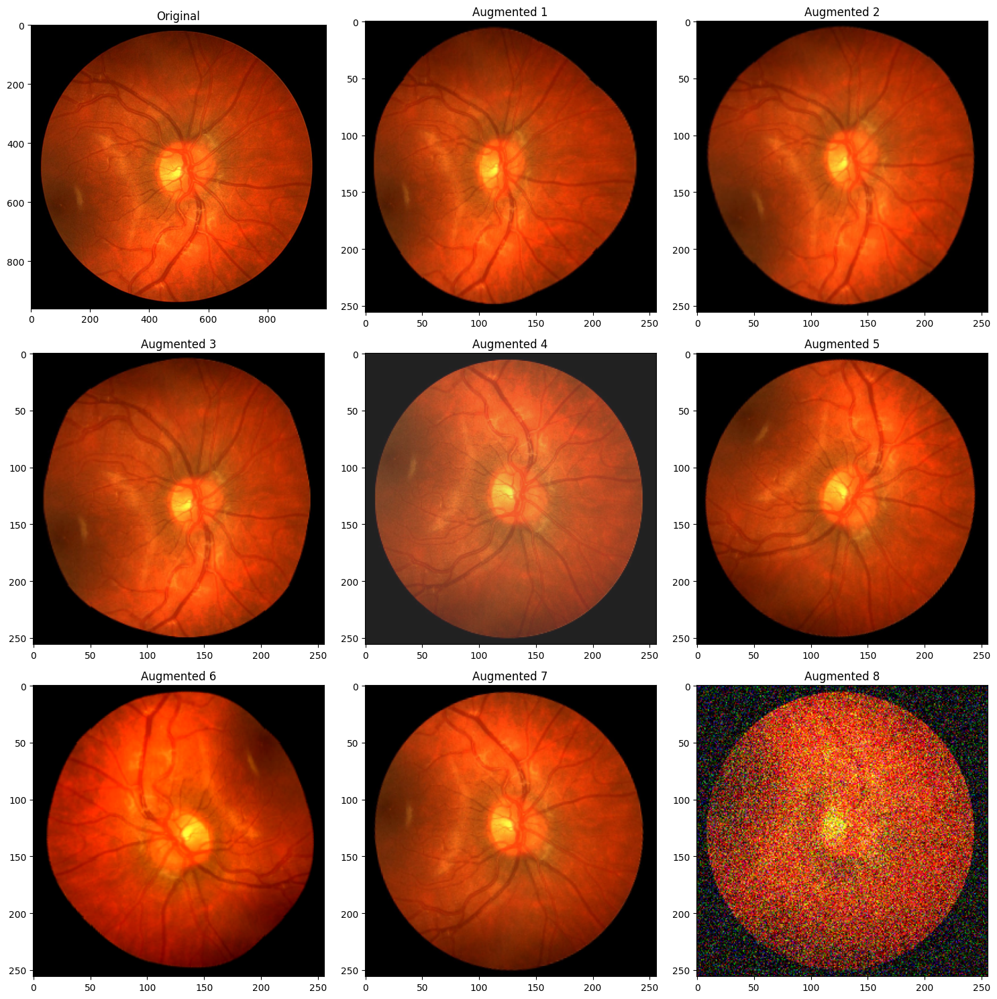

In [ ]:
def calculate_augmented_dataset_size():
    # Original dataset size
    num_train_original = len(train_imgs)
    num_test_original = len(test_imgs)

    # Calculate number of possible augmentations per image
    # Based on our transform probabilities:
    # HorizontalFlip (0.5), VerticalFlip (0.5), Rotate (0.5),
    # RandomBrightnessContrast (0.2), GaussNoise (0.2), GridDistortion (0.2)

    possible_combinations = 2 ** 6  # 6 augmentations = 64 possible combinations

    print("Dataset Statistics:")
    print(f"Original Training Images: {num_train_original}")
    print(f"Original Testing Images: {num_test_original}")
    print(f"Possible augmented versions per image: {possible_combinations}")
    print(f"Total possible training images per epoch: {num_train_original * possible_combinations}")

    # Let's show some augmented versions of the same image
    sample_img = cv2.imread(train_imgs[0])
    sample_img = cv2.cvtColor(sample_img, cv2.COLOR_BGR2RGB)
    sample_mask = cv2.imread(train_masks[0][0], cv2.IMREAD_GRAYSCALE)

    transform = get_transforms('train')

    # Display grid of augmented versions
    fig, axes = plt.subplots(3, 3, figsize=(15, 15))
    axes[0, 0].imshow(sample_img)
    axes[0, 0].set_title('Original')

    for i in range(3):
        for j in range(3):
            if i == 0 and j == 0:
                continue
            augmented = transform(image=sample_img, mask=sample_mask)
            axes[i, j].imshow(augmented['image'])
            axes[i, j].set_title(f'Augmented {i*3 + j}')

    plt.tight_layout()
    plt.show()

# Calculate and display augmented dataset statistics
calculate_augmented_dataset_size()

In [ ]:
import torch.nn as nn
import timm
from einops import rearrange

class PatchEmbed(nn.Module):
    def __init__(self, img_size=256, patch_size=16, in_channels=3, embed_dim=768):
        super().__init__()
        self.img_size = (img_size, img_size)
        self.patch_size = (patch_size, patch_size)
        self.n_patches = (img_size // patch_size) ** 2

        self.proj = nn.Conv2d(
            in_channels,
            embed_dim,
            kernel_size=patch_size,
            stride=patch_size
        )

    def forward(self, x):
        x = self.proj(x)
        x = rearrange(x, 'b c h w -> b (h w) c')
        return x

class TransUNet(nn.Module):
    def __init__(self, img_size=256, patch_size=16, in_channels=3, embed_dim=768,
                 depth=12, num_heads=12, mlp_ratio=4, num_classes=1):
        super().__init__()

        self.patch_embed = PatchEmbed(
            img_size=img_size,
            patch_size=patch_size,
            in_channels=in_channels,
            embed_dim=embed_dim
        )

        self.vit = timm.create_model(
            'vit_base_patch16_384',
            pretrained=True,
            num_classes=0
        )

        self.decoder1 = nn.Conv2d(embed_dim, 512, 3, padding=1)
        self.decoder2 = nn.Conv2d(512, 256, 3, padding=1)
        self.decoder3 = nn.Conv2d(256, 128, 3, padding=1)
        self.decoder4 = nn.Conv2d(128, 64, 3, padding=1)

        self.dropout = nn.Dropout(0.3)
        self.upscale = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        self.final_conv = nn.Conv2d(64, num_classes, 1)

        self.activation = nn.ReLU(inplace=True)

    def forward(self, x):
        x = self.patch_embed(x)
        x = self.vit.blocks(x)

        # Calculate the correct h and w based on the number of patches
        # Assuming the number of patches is the second dimension of x
        num_patches = x.shape[1]
        patch_size = 16  # Or whatever your patch size is
        h = w = int(num_patches**0.5)  # Assuming square image patches

        x = rearrange(x, 'b (h w) c -> b c h w', h=h, w=w)

        x = self.dropout(self.activation(self.decoder1(x)))
        x = self.upscale(x)
        x = self.dropout(self.activation(self.decoder2(x)))
        x = self.upscale(x)
        x = self.dropout(self.activation(self.decoder3(x)))
        x = self.upscale(x)
        x = self.dropout(self.activation(self.decoder4(x)))
        x = self.upscale(x)

        x = self.final_conv(x)
        return x


# Initialize model
def initialize_model():
    model = TransUNet(
        img_size=256,
        patch_size=16,
        in_channels=3,
        embed_dim=768,
        num_classes=1
    ).to(device)

    # Initialize optimizer
    optimizer = torch.optim.AdamW(
        model.parameters(),
        lr=1e-4,
        weight_decay=1e-5
    )

    return model, optimizer

# Create model and optimizer
model, optimizer = initialize_model()

# Print model summary
def print_model_summary():
    test_input = torch.randn(1, 3, 256, 256).to(device)
    print("Input shape:", test_input.shape)
    output = model(test_input)
    print("Output shape:", output.shape)

    total_params = sum(p.numel() for p in model.parameters())
    print(f"\nTotal parameters: {total_params:,}")

print_model_summary()

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model.safetensors:   0%|          | 0.00/347M [00:00<?, ?B/s]

Input shape: torch.Size([1, 3, 256, 256])
Output shape: torch.Size([1, 1, 256, 256])

Total parameters: 91,769,345


In [ ]:
import torch
from tqdm import tqdm
import numpy as np
from datetime import datetime
import os


from torch.cuda.amp import autocast, GradScaler

scaler = GradScaler()
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=10, eta_min=1e-6)

def train_one_epoch(model, dataloader, optimizer, criterion, device, epoch):
    model.train()
    epoch_loss = 0
    dice_scores = []

    progress_bar = tqdm(dataloader, desc=f'Epoch {epoch + 1}')
    for images, masks in progress_bar:
        images, masks = images.to(device), masks.to(device)
        optimizer.zero_grad()

        with autocast():  # Mixed precision
            outputs = model(images)
            loss = criterion(outputs, masks)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        pred_masks = (torch.sigmoid(outputs) > 0.5).float()
        dice_score = calculate_dice_score(pred_masks, masks)

        epoch_loss += loss.item()
        dice_scores.append(dice_score)

        progress_bar.set_postfix({'loss': f'{loss.item():.4f}', 'dice': f'{dice_score:.4f}'})

    scheduler.step()
    return epoch_loss / len(dataloader), np.mean(dice_scores)


def calculate_accuracy(pred, target):
      correct = (pred == target).float()
      accuracy = correct.sum() / correct.numel()
      return accuracy.item()

def calculate_sensitivity(pred, target):
      # Sensitivity: TP / (TP + FN)
      true_positive = ((pred == 1) & (target == 1)).float().sum()
      false_negative = ((pred == 0) & (target == 1)).float().sum()
      sensitivity = true_positive / (true_positive + false_negative + 1e-5)
      return sensitivity.item()

def calculate_specificity(pred, target):
      # Specificity: TN / (TN + FP)
      true_negative = ((pred == 0) & (target == 0)).float().sum()
      false_positive = ((pred == 1) & (target == 0)).float().sum()
      specificity = true_negative / (true_negative + false_positive + 1e-5)
      return specificity.item()

def test_model(model, dataloader, criterion, device):
      model.eval()
      test_loss = 0
      dice_scores = []
      accuracies = []
      sensitivities = []
      specificities = []

      with torch.no_grad():
          for images, masks in tqdm(dataloader, desc='Testing'):
              images, masks = images.to(device), masks.to(device)

              # Adjust the mask dimensions if necessary
              if len(masks.shape) == 3:
                  masks = masks.unsqueeze(1)

              # Run the model
              outputs = model(images)
              loss = criterion(outputs, masks)

              # Convert predictions to binary mask
              pred_masks = (torch.sigmoid(outputs) > 0.5).float()

              # Calculate metrics
              dice_score = calculate_dice_score(pred_masks, masks)
              accuracy = calculate_accuracy(pred_masks, masks)
              sensitivity = calculate_sensitivity(pred_masks, masks)
              specificity = calculate_specificity(pred_masks, masks)

              # Collect metrics
              test_loss += loss.item()
              dice_scores.append(dice_score)
              accuracies.append(accuracy)
              sensitivities.append(sensitivity)
              specificities.append(specificity)

      # Average all metrics
      avg_loss = test_loss / len(dataloader)
      avg_dice = np.mean(dice_scores)
      avg_accuracy = np.mean(accuracies)
      avg_sensitivity = np.mean(sensitivities)
      avg_specificity = np.mean(specificities)

      print(f"Test Loss: {avg_loss:.4f} | Test Dice: {avg_dice:.4f}")
      print(f"Accuracy: {avg_accuracy:.4f} | Sensitivity: {avg_sensitivity:.4f} | Specificity: {avg_specificity:.4f}")

      return avg_loss, avg_dice, avg_accuracy, avg_sensitivity, avg_specificity

def test_model_with_tta(model, dataloader, criterion, device):
    model.eval()
    test_loss = 0
    dice_scores = []

    with torch.no_grad():
        for images, masks in tqdm(dataloader, desc='Testing'):
            images, masks = images.to(device), masks.to(device)

            augmented_preds = []
            for flip in [None, A.HorizontalFlip(p=1), A.VerticalFlip(p=1)]:
                if flip:
                    aug = flip(image=images[0].cpu().numpy())
                    images = torch.tensor(aug['image']).to(device)
                outputs = model(images)
                augmented_preds.append(torch.sigmoid(outputs))

            final_preds = torch.mean(torch.stack(augmented_preds), dim=0)
            loss = criterion(final_preds, masks)

            pred_masks = (final_preds > 0.5).float()
            dice_score = calculate_dice_score(pred_masks, masks)

            test_loss += loss.item()
            dice_scores.append(dice_score)

    return test_loss / len(dataloader), np.mean(dice_scores)



def calculate_dice_score(pred, target):
    smooth = 1e-5
    intersection = torch.sum(pred * target)
    union = torch.sum(pred) + torch.sum(target)
    dice = (2. * intersection + smooth) / (union + smooth)
    return dice.item()

def save_checkpoint(model, optimizer, epoch, best_dice, filename):
    checkpoint = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'best_dice': best_dice,
    }
    torch.save(checkpoint, filename)

def train_model(model, train_loader, val_loader, optimizer, criterion, device,
                num_epochs=100, patience=10, checkpoint_dir='/content/drive/MyDrive/checkpoints'):
    best_dice = 0
    patience_counter = 0
    start_time = datetime.now().strftime("%Y%m%d_%H%M%S")

    os.makedirs(checkpoint_dir, exist_ok=True)

    for epoch in range(num_epochs):
        print(f"\nEpoch {epoch + 1}/{num_epochs}")

        train_loss, train_dice = train_one_epoch(
            model, train_loader, optimizer, criterion, device, epoch
        )

        val_loss, val_dice, val_accuracy, val_sensitivity, val_specificity = test_model(model, val_loader, criterion, device)

        print(f"Train Loss: {train_loss:.4f} | Train Dice: {train_dice:.4f}")
        print(f"Val Loss: {val_loss:.4f} | Val Dice: {val_dice:.4f}")
        print(f"Val Accuracy: {val_accuracy:.4f} | Val Sensitivity: {val_sensitivity:.4f} | Val Specificity: {val_specificity:.4f}")

        if val_dice > best_dice:
            best_dice = val_dice
            patience_counter = 0
            save_checkpoint(
                model, optimizer, epoch, best_dice,
                f"{checkpoint_dir}/best_model_{start_time}.pth"
            )
            print(f"New best model saved! Dice: {best_dice:.4f}")
        else:
            patience_counter += 1

        if patience_counter >= patience:
            print(f"Early stopping triggered after {epoch + 1} epochs")
            break

        if (epoch + 1) % 10 == 0:
            save_checkpoint(
                model, optimizer, epoch, best_dice,
                f"{checkpoint_dir}/checkpoint_epoch_{epoch + 1}_{start_time}.pth"
            )

    return best_dice

model, optimizer = initialize_model()
criterion = FocalTverskyLoss(alpha=0.7, gamma=0.75)

best_dice = train_model(
    model=model,
    train_loader=train_loader,
    val_loader=test_loader,
    optimizer=optimizer,
    criterion=criterion,
    device=device,
    num_epochs=10,
    patience=5,
    checkpoint_dir='/content/drive/MyDrive/checkpoints'
)

print(f"Training completed! Best Dice score: {best_dice:.4f}")


<ipython-input-21-3d83550523b5>:10: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()
/usr/local/lib/python3.11/dist-packages/torch/amp/grad_scaler.py:132: UserWarning: torch.cuda.amp.GradScaler is enabled, but CUDA is not available.  Disabling.
  warnings.warn(



Epoch 1/10


Epoch 1:   0%|          | 0/5 [00:00<?, ?it/s]<ipython-input-21-3d83550523b5>:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # Mixed precision
/usr/local/lib/python3.11/dist-packages/torch/amp/autocast_mode.py:266: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn(
Epoch 1: 100%|██████████| 5/5 [01:21<00:00, 16.33s/it, loss=0.9167, dice=0.5776]
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:227: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(
Testing: 100%|██████

Test Loss: 0.9086 | Test Dice: 0.1548
Accuracy: 0.0840 | Sensitivity: 1.0000 | Specificity: 0.0001
Train Loss: 0.9147 | Train Dice: 0.3892
Val Loss: 0.9086 | Val Dice: 0.1548
Val Accuracy: 0.0840 | Val Sensitivity: 1.0000 | Val Specificity: 0.0001
New best model saved! Dice: 0.1548

Epoch 2/10


Testing: 100%|██████████| 2/2 [00:10<00:00,  5.42s/it]


Test Loss: 0.8769 | Test Dice: 0.2177
Accuracy: 0.4285 | Sensitivity: 0.9470 | Specificity: 0.3810
Train Loss: 0.9015 | Train Dice: 0.7167
Val Loss: 0.8769 | Val Dice: 0.2177
Val Accuracy: 0.4285 | Val Sensitivity: 0.9470 | Val Specificity: 0.3810
New best model saved! Dice: 0.2177

Epoch 3/10


Testing: 100%|██████████| 2/2 [00:10<00:00,  5.47s/it]


Test Loss: 0.8496 | Test Dice: 0.2447
Accuracy: 0.6560 | Sensitivity: 0.6631 | Specificity: 0.6553
Train Loss: 0.8688 | Train Dice: 0.7805
Val Loss: 0.8496 | Val Dice: 0.2447
Val Accuracy: 0.6560 | Val Sensitivity: 0.6631 | Val Specificity: 0.6553
New best model saved! Dice: 0.2447

Epoch 4/10


Testing: 100%|██████████| 2/2 [00:09<00:00,  4.90s/it]


Test Loss: 0.8483 | Test Dice: 0.2449
Accuracy: 0.6754 | Sensitivity: 0.6226 | Specificity: 0.6802
Train Loss: 0.8571 | Train Dice: 0.8286
Val Loss: 0.8483 | Val Dice: 0.2449
Val Accuracy: 0.6754 | Val Sensitivity: 0.6226 | Val Specificity: 0.6802
New best model saved! Dice: 0.2449

Epoch 5/10


Testing: 100%|██████████| 2/2 [00:10<00:00,  5.14s/it]


Test Loss: 0.8424 | Test Dice: 0.2501
Accuracy: 0.7135 | Sensitivity: 0.5669 | Specificity: 0.7269
Train Loss: 0.8594 | Train Dice: 0.8457
Val Loss: 0.8424 | Val Dice: 0.2501
Val Accuracy: 0.7135 | Val Sensitivity: 0.5669 | Val Specificity: 0.7269
New best model saved! Dice: 0.2501

Epoch 6/10


Testing: 100%|██████████| 2/2 [00:10<00:00,  5.31s/it]


Test Loss: 0.8547 | Test Dice: 0.2391
Accuracy: 0.6152 | Sensitivity: 0.7173 | Specificity: 0.6059
Train Loss: 0.8598 | Train Dice: 0.9182
Val Loss: 0.8547 | Val Dice: 0.2391
Val Accuracy: 0.6152 | Val Sensitivity: 0.7173 | Val Specificity: 0.6059

Epoch 7/10


Testing: 100%|██████████| 2/2 [00:09<00:00,  4.97s/it]


Test Loss: 0.8255 | Test Dice: 0.2163
Accuracy: 0.8809 | Sensitivity: 0.1957 | Specificity: 0.9436
Train Loss: 0.8529 | Train Dice: 0.8432
Val Loss: 0.8255 | Val Dice: 0.2163
Val Accuracy: 0.8809 | Val Sensitivity: 0.1957 | Val Specificity: 0.9436

Epoch 8/10


Epoch 8:  20%|██        | 1/5 [00:32<02:10, 32.50s/it, loss=0.8641, dice=0.6575]


KeyboardInterrupt: 

In [ ]:
import matplotlib.pyplot as plt

def display_segmented_images(model, dataloader, device, num_images=5):
    """Displays segmented images alongside original and ground truth.

    Args:
        model: The trained segmentation model.
        dataloader: DataLoader for the dataset.
        device: The device to run the model on (e.g., 'cuda' or 'cpu').
        num_images: Number of images to display.
    """

    model.eval()  # Set model to evaluation mode

    with torch.no_grad():  # Disable gradient calculations
        for i, (images, masks) in enumerate(dataloader):
            if i >= num_images:
                break

            images, masks = images.to(device), masks.to(device)

            # Get model predictions
            outputs = model(images)
            pred_masks = (torch.sigmoid(outputs) > 0.5).float()  # Threshold predictions

            # Move tensors to CPU for plotting
            images = images.cpu()
            masks = masks.cpu()
            pred_masks = pred_masks.cpu()

            # Plot the images, masks, and predictions
            for j in range(images.shape[0]):
                fig, axes = plt.subplots(1, 3, figsize=(15, 5))

                axes[0].imshow(images[j].permute(1, 2, 0))  # Original image
                axes[0].set_title('Original Image')
                axes[0].axis('off')

                axes[1].imshow(masks[j].squeeze(), cmap='gray')  # Ground truth mask
                axes[1].set_title('Ground Truth Mask')
                axes[1].axis('off')

                axes[2].imshow(pred_masks[j].squeeze(), cmap='gray')  # Predicted mask
                axes[2].set_title('Predicted Mask')
                axes[2].axis('off')

                plt.show()

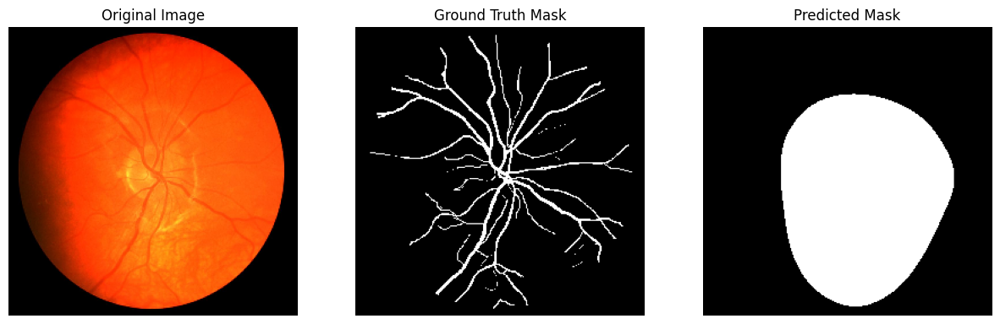

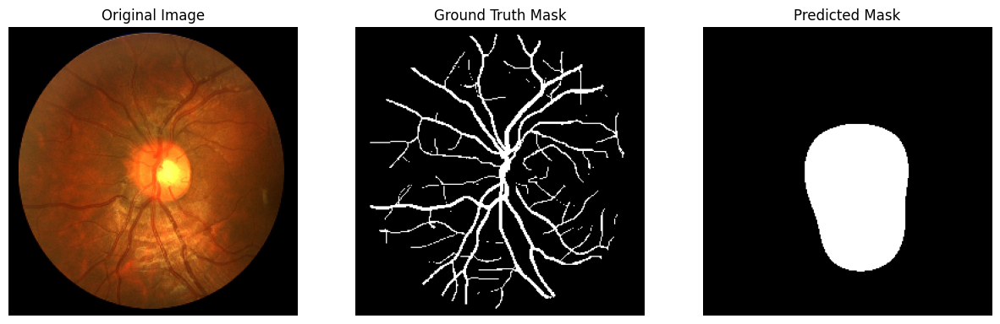

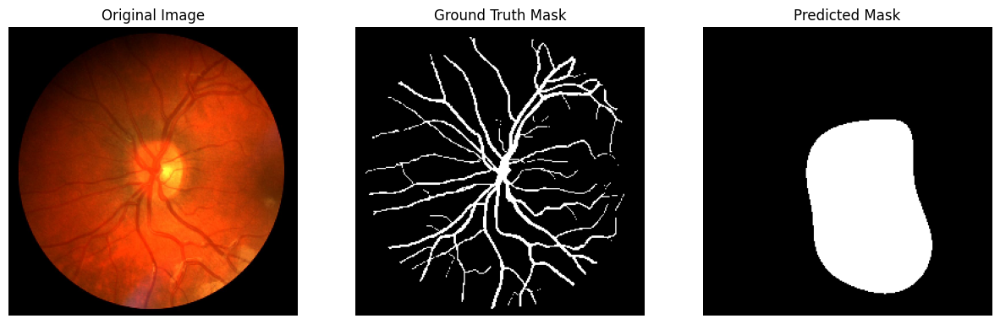

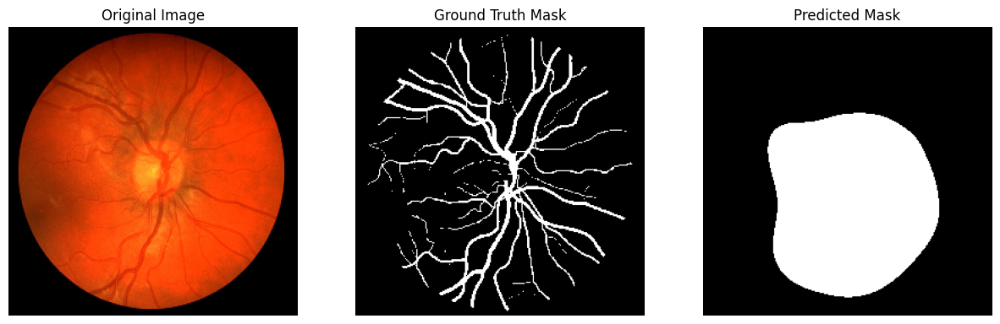

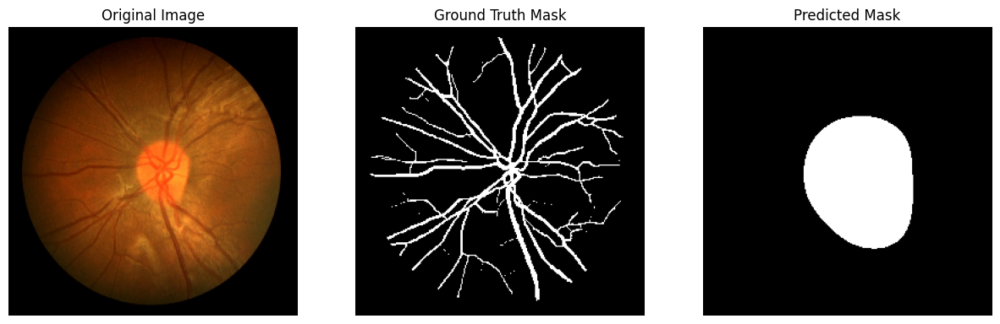

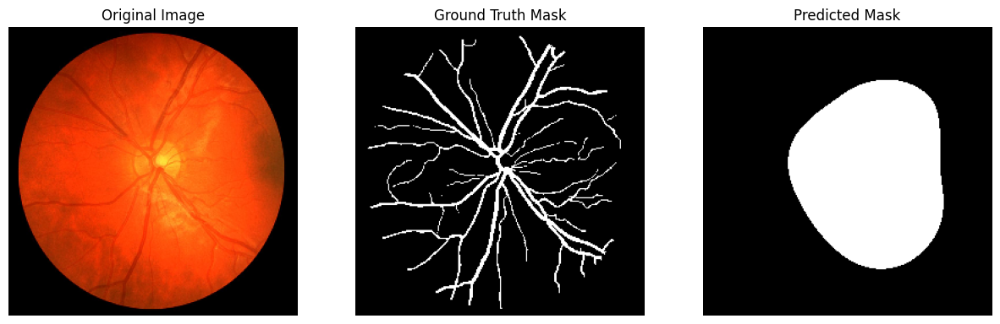

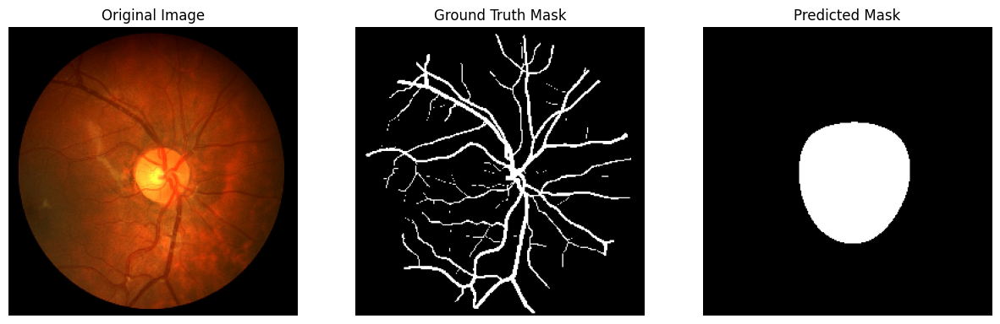

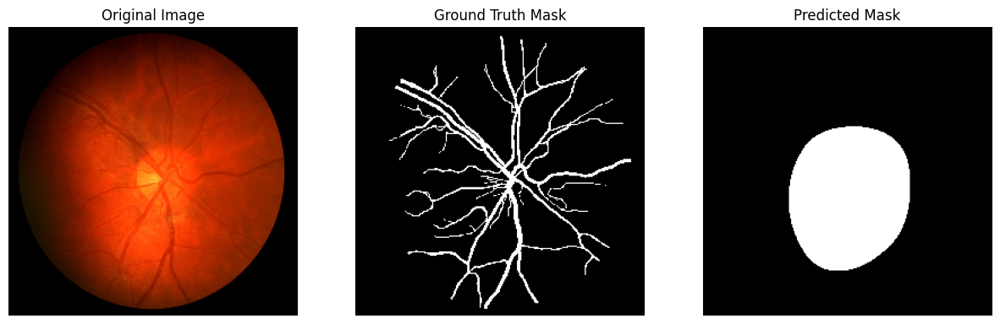

In [ ]:

display_segmented_images(model, test_loader, device, num_images=5)

In [ ]:
import torch
import matplotlib.pyplot as plt

def display_segmented_images(model, dataloader, device, num_images=5):
    """Displays original, ground truth, predicted, and segmented output images.

    Args:
        model: The trained segmentation model.
        dataloader: DataLoader for the dataset.
        device: The device to run the model on (e.g., 'cuda' or 'cpu').
        num_images: Number of batches to display.
    """

    model.eval()  # Set model to evaluation mode

    with torch.no_grad():
        for i, (images, masks) in enumerate(dataloader):
            if i >= num_images:
                break

            images, masks = images.to(device), masks.to(device)
            outputs = model(images)
            pred_masks = (torch.sigmoid(outputs) > 0.5).float()

            # Move to CPU for visualization
            images = images.cpu()
            masks = masks.cpu()
            pred_masks = pred_masks.cpu()

            for j in range(images.shape[0]):
                fig, axes = plt.subplots(1, 4, figsize=(20, 5))

                original = images[j].permute(1, 2, 0).numpy()
                ground_truth = masks[j].squeeze().numpy()
                prediction = pred_masks[j].squeeze().numpy()

                # Ensure original is in [0, 1] for display
                if original.max() > 1:
                    original = original / 255.0

                # Create a segmented output image by overlaying the prediction on the original
                overlay = original.copy()
                overlay[:, :, 0] = prediction  # Red channel for mask
                segmented = 0.6 * original + 0.4 * overlay  # Blend

                axes[0].imshow(original)
                axes[0].set_title('Original Image')
                axes[0].axis('off')

                axes[1].imshow(ground_truth, cmap='gray')
                axes[1].set_title('Ground Truth Mask')
                axes[1].axis('off')

                axes[2].imshow(prediction, cmap='gray')
                axes[2].set_title('Predicted Mask')
                axes[2].axis('off')

                axes[3].imshow(segmented)
                axes[3].set_title('Segmented Output')
                axes[3].axis('off')

                plt.tight_layout()
                plt.show()


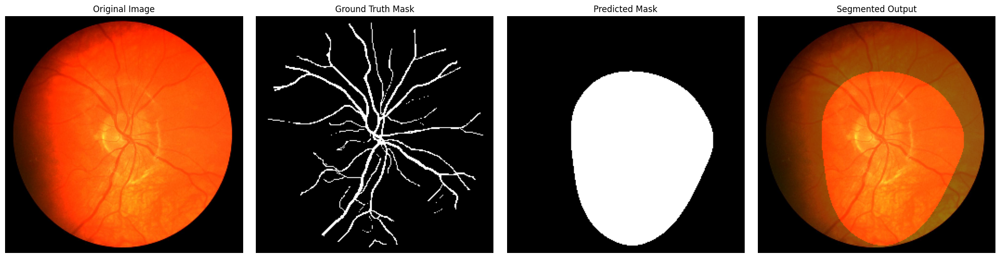

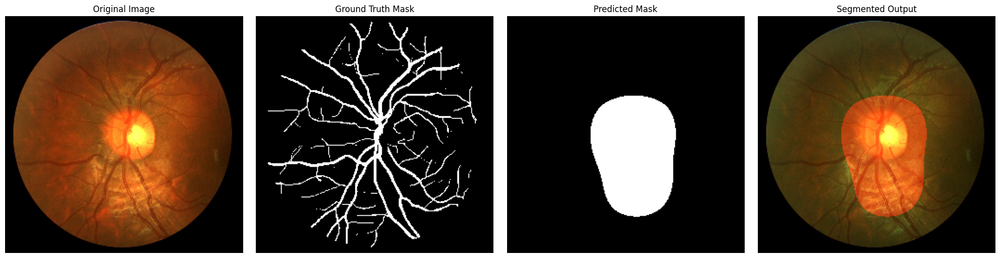

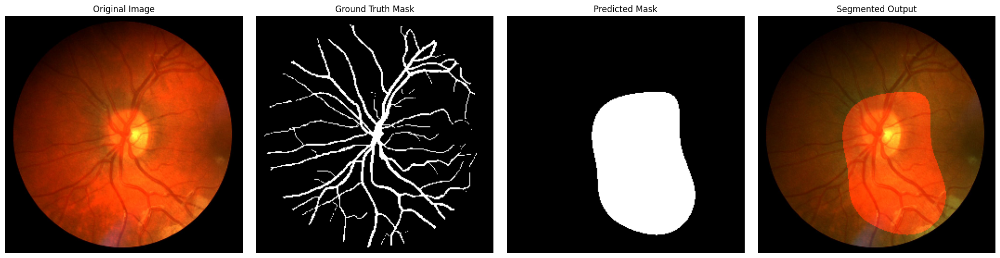

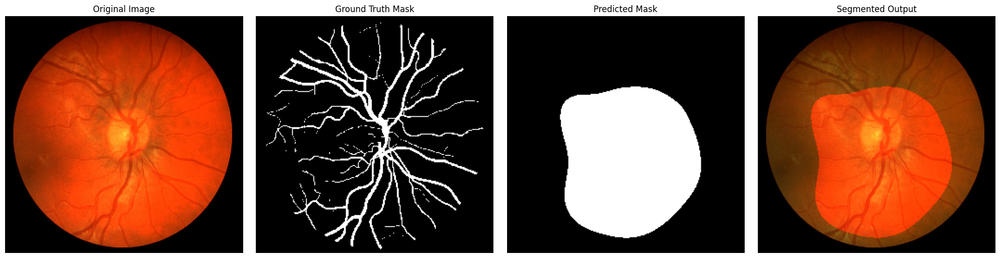

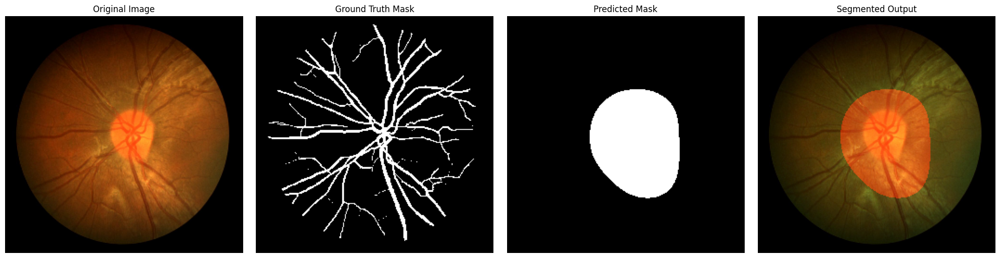

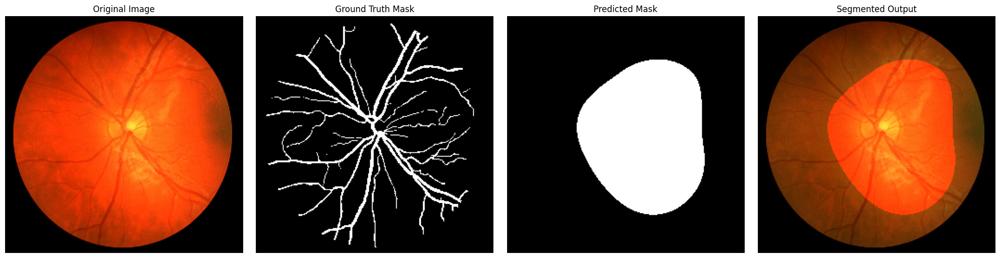

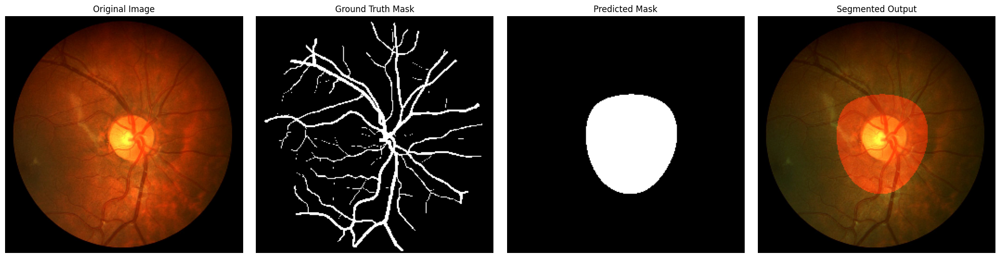

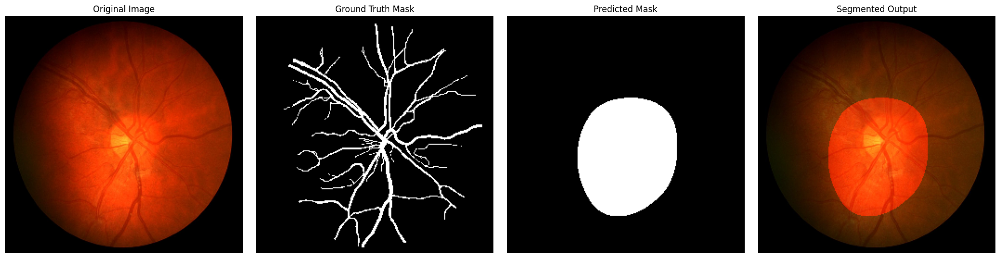

In [ ]:
display_segmented_images(model, test_loader, device, num_images=5)

In [ ]:
import torch
import matplotlib.pyplot as plt

def display_retina_segmentation(model, dataloader, device, num_images=5):
    """Displays only the segmented retina output (mask overlaid on the eye image)."""

    model.eval()

    with torch.no_grad():
        count = 0
        for images, _ in dataloader:
            if count >= num_images:
                break

            images = images.to(device)
            outputs = model(images)
            pred_masks = (torch.sigmoid(outputs) > 0.5).float()

            images = images.cpu()
            pred_masks = pred_masks.cpu()

            for i in range(images.shape[0]):
                original = images[i].permute(1, 2, 0).numpy()
                mask = pred_masks[i].squeeze().numpy()

                # Normalize if needed
                if original.max() > 1:
                    original = original / 255.0

                # Overlay: red mask on original image
                overlay = original.copy()
                if overlay.shape[-1] == 1:  # Handle grayscale
                    overlay = overlay.squeeze()
                    overlay = plt.cm.gray(overlay)[..., :3]

                overlay[:, :, 0] = mask  # red channel
                segmented = 0.6 * original + 0.4 * overlay

                plt.figure(figsize=(5, 5))
                plt.imshow(segmented)
                plt.title("Segmented Retina Output")
                plt.axis('off')
                plt.show()

                count += 1
                if count >= num_images:
                    break


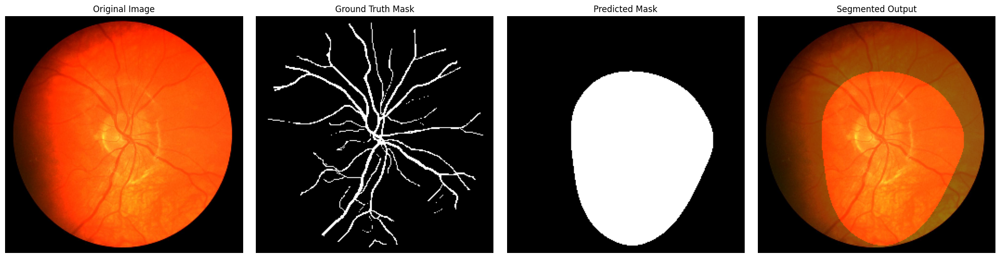

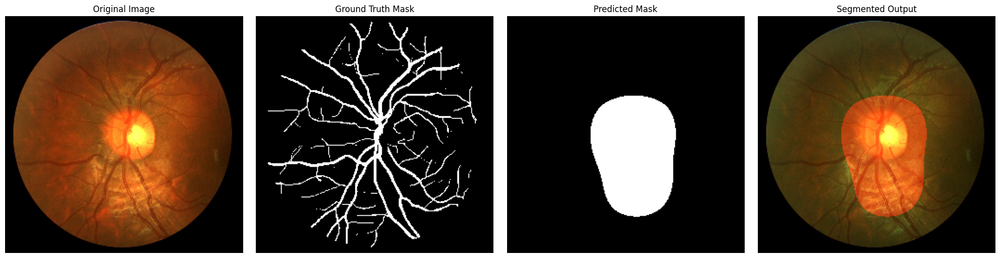

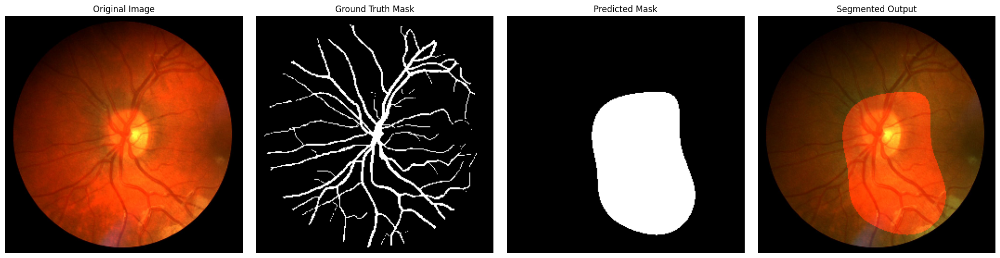

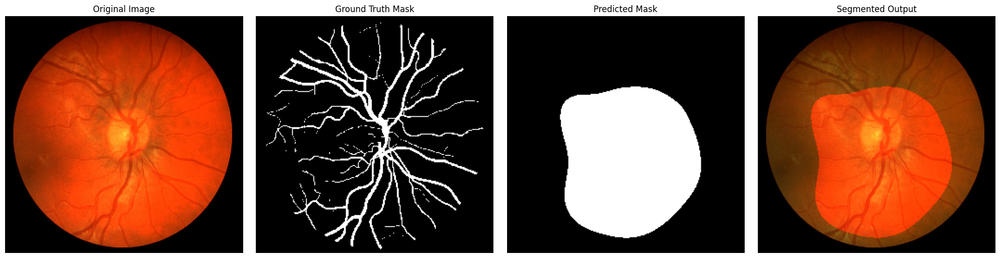

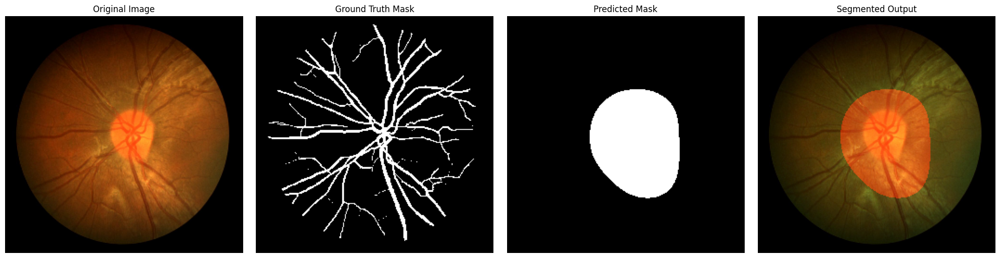

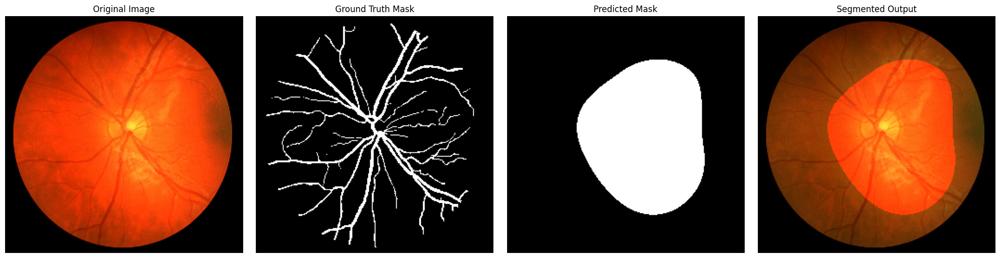

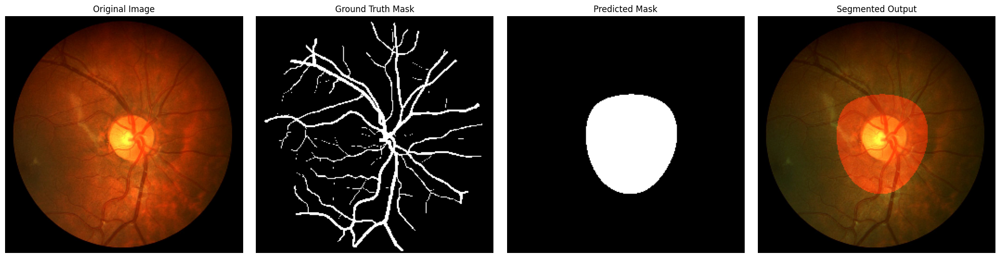

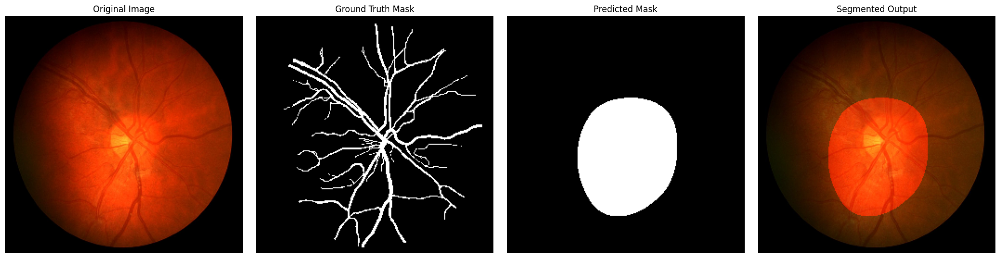

In [ ]:
display_segmented_images(model, test_loader, device, num_images=5)